# 1. Preliminary

## 1.1 Context

Date : Février 2024  
Auteur : Julien Caramanno  
Source : https://www.kaggle.com/c/home-credit-default-risk/data

## 1.2 Problem Statement

Il y a 7 sources de données différentes :

application_train/application_test : les principales données de train et de test avec des informations sur chaque demande de prêt. Chaque prêt a sa propre ligne et est identifié par la caractéristique SK_ID_CURR. Les données de train sont accompagnées de la caractéristique TARGET indiquant 0 : le prêt a été remboursé ou 1 : le prêt n'a pas été remboursé.

bureau : données concernant les crédits antérieurs du client auprès d'autres institutions financières. Chaque crédit précédent a sa propre ligne dans bureau, mais un prêt existant dans application_(train|test) peut avoir plusieurs crédits précédents.

bureau_balance : données mensuelles concernant les crédits précédents dans bureau. Chaque ligne correspond à un mois de crédit précédent, et un crédit précédent unique peut avoir plusieurs lignes, une pour chaque mois de la durée du crédit.

previous_application : demandes précédentes de prêts des clients qui ont des prêts dans les données de application_(train|test). Chaque prêt actuel dans les données de application_(train|test) peut avoir plusieurs prêts précédents. Chaque demande précédente a une ligne et est identifiée par la caractéristique SK_ID_PREV.

POS_CASH_BALANCE : données mensuelles sur les prêts au point de vente ou en espèces que les clients ont eu avec Home Credit. Chaque ligne correspond à un mois d'un prêt au point de vente ou d'un prêt en espèces précédent, et un seul prêt précédent peut avoir plusieurs lignes.

credit_card_balance : données mensuelles sur les cartes de crédit que les clients ont eu. Chaque ligne correspond à un mois de solde de carte de crédit, et une seule carte de crédit peut avoir plusieurs lignes.

installments_payment : historique des paiements pour les prêts précédents. Il y a une ligne pour chaque paiement effectué et une ligne pour chaque paiement manqué.

## 1.3 Importation & Requierements 

In [1]:
#Importations de bibliothèques
import gc
from hyperopt import hp
from hyperopt import tpe
from hyperopt import fmin
from hyperopt import space_eval, STATUS_OK

from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

import lightgbm as lgb
import lime
from lime import lime_tabular

import matplotlib as mpl
%matplotlib inline
import matplotlib.pyplot as plt
import missingno as msno
import numpy as np
import pandas as pd
import pickle 
import random
import re
import seaborn as sns
import shap

import sklearn
from sklearn.dummy import DummyClassifier
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder

from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import auc
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix

from sklearn.model_selection import cross_validate
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import train_test_split

import mlflow
import mlflow.sklearn

import time

# Versions
print('Version des librairies utilisées :')


print('Matplotlib            : ' + mpl.__version__)
print('Missingno             : ' + msno.__version__)
print('NumPy                 : ' + np.version.full_version)
print('Pandas                : ' + pd.__version__)
print('Seaborn               : ' + sns.__version__)
print('Shap                  : ' + shap.__version__)
print('Sklearn               : ' + sklearn.__version__ )

Version des librairies utilisées :
Matplotlib            : 3.8.2
Missingno             : 0.5.2
NumPy                 : 1.26.2
Pandas                : 2.1.4
Seaborn               : 0.13.0
Shap                  : 0.44.1
Sklearn               : 1.3.2


In [2]:
# Configuration initiale 
import warnings
warnings.simplefilter(action='ignore', category= FutureWarning)

pd.set_option('display.max_columns', 300)
pd.set_option('display.max_row', 500)
pd.set_option('display.max_colwidth', 200)

In [3]:
seed = 42
np.random.seed(seed)
random.seed(seed)

# 1.4 Fonctions

In [4]:
def timeit(f):
    ''' 
    fonction décoratrice qui donne le temps d'éxecution d'une autre fonction
    '''
    def timed(*args, **kw):

        ts = time.time()
        result = f(*args, **kw)
        te = time.time()

        print (f"Durée d'exécution de {f.__name__}: {te-ts}s")
        return result

    return timed

## 1.4.1 Fonctions pour l'analyse de données

In [5]:
@timeit
def missing_values(df):
        '''
        Fonction qui calcule et affiche le nombre
        et le pourcentage de valeurs manquantes 
        par colonne dans un DataFrame.
        
        '''
        # Nombre total de valeurs manquantes
        mis_val = df.isna().sum()
        
        # Pourcentage de valeurs manquantes
        mis_val_percent =(df.isnull().sum() / len(df))*100
        
        # Construction d'un tableau avec les résultats
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
        
        # Renommage des colonnes
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Valeurs manquantes', 1 : '% total des valeurs'})
        
        # On range de manière décroissante 
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% total des valeurs', ascending=False).round(1)
        
        
        # Return the dataframe with missing information
        return mis_val_table_ren_columns

In [6]:
@timeit
def description_dataset(data, name):
    """
    Retourne la description d'un ensemble de données.

    Paramètres :
        data : dataframe
        name : 
        
    Renvoie :
        les 3 premières lignes du dataframe
        la forme, les types, le nombre de valeurs nulles,
        le nombre de valeurs uniques, le nombre de valeurs dupliquées
    """
    print("On traite le dataset ", name)
    msno.bar(data)
    
    display(data.head(3))
    print(f'Taille :-------------------------------------------------------------- {data.shape}')
    
    print("--"*50)
    print("Valeurs manquantes par colonnes (%): ")
    table = missing_values(data)
    display(table.head(50))

    print("--"*50)
    print("Valeurs différentes par variables : ")
    for col in data:
        if data[col].nunique() < 30:
            print(f'{col :-<70} {data[col].unique()}')
        else: 
            print(f'{col :-<70} contient {data[col].nunique()} valeurs différentes')
    print("--"*50)
    print(f"Nombre de doublons : {data.duplicated().sum()}")

In [7]:
def cleaning_categories(col):
    '''
    Fonction qui nettoie une phrase de ses caractères spéciaux.
    Et la passe en majuscule( pour un passage en nom de colonne avec one hot)
    '''
    col = str(col).replace('-', '').replace('+', '').replace('/', ' ').replace(':', '_')
    col = str(col).upper()
    return col

# 1.4.2 Fonctions pour le prétraitement des données

In [8]:
@timeit
def cat_encoder(features, test_features):
    '''
    
    Fonction qui applique un one hot encodage sur les variables
    catégorielles à l'aide de get_dummies, un label encoder sur les variables binaires. 
    Traite les valeurs manquantes comme des catégories et retourne les datasets encodés.
    
    '''
    label_encoder = LabelEncoder()
    
    categorical_columns_train  = []
    categorical_columns_test  = []
    
    for col in features :
        if col != "TARGET":
            if features[col].dtype == object:
                #Label encodage pour les variables binaires
                if features[col].nunique()==2:
                    features[col] = label_encoder.fit_transform(features[col])
                #récupération des colonnes où on fera un one hot encodage
                elif features[col].nunique()>2:
                    categorical_columns_train.append(col)
                    
    features = pd.get_dummies(features, columns = categorical_columns_train,dummy_na= True)
    
    for col in test_features :
        if test_features[col].dtype == object:
            #Label encodage pour les variables binaires
            if test_features[col].nunique()==2:
                test_features[col] = label_encoder.fit_transform(test_features[col])
            #récupération des colonnes où on fera un one hot encodage
            elif test_features[col].nunique()>2:
                categorical_columns_test.append(col)
    
    test_features = pd.get_dummies(test_features,columns = categorical_columns_test, dummy_na= True)
    
    #Alignement des dataframes
    features, test_features = features.align(test_features, join= 'inner', axis=1)

    return features, test_features

In [9]:
@timeit
def clean_data(train, test):
    '''
    
    Nettoie les données en traitant les valeurs aberrantes,
    créant de nouvelles caractéristiques, et préparant les données pour la modélisation
    
    '''

    # Valeurs abérantes
    train['DAYS_EMPLOYED_ANOM'] = train["DAYS_EMPLOYED"] == 365243
    test['DAYS_EMPLOYED_ANOM'] = test["DAYS_EMPLOYED"] == 365243

    train['DAYS_EMPLOYED'].replace({365243: np.nan}, inplace = True)
    test["DAYS_EMPLOYED"].replace({365243: np.nan}, inplace = True)

    #Création de feature
    df_train = train.copy()
    df_test = test.copy()

    #train data
    df_train['PROPORTION_LIFE_EMPLOYED'] = df_train['DAYS_EMPLOYED'] / df_train['DAYS_BIRTH']
    df_train['INCOME_TO_CREDIT_RATIO'] = df_train['AMT_INCOME_TOTAL'] / df_train['AMT_CREDIT']
    df_train['INCOME_TO_ANNUITY_RATIO'] = df_train['AMT_INCOME_TOTAL'] / df_train['AMT_ANNUITY']
    df_train['INCOME_TO_ANNUITY_RATIO_BY_AGE'] = df_train['INCOME_TO_ANNUITY_RATIO'] * df_train['DAYS_BIRTH']
    df_train['CREDIT_TO_ANNUITY_RATIO'] = df_train['AMT_CREDIT'] / df_train['AMT_ANNUITY']
    df_train['CREDIT_TO_ANNUITY_RATIO_BY_AGE'] = df_train['CREDIT_TO_ANNUITY_RATIO'] * df_train['DAYS_BIRTH']
    df_train['INCOME_TO_FAMILYSIZE_RATIO'] = df_train['AMT_INCOME_TOTAL'] / df_train['CNT_FAM_MEMBERS']
    df_train['ANNUITY_INCOME_PERC'] = df_train['AMT_ANNUITY'] / df_train['AMT_INCOME_TOTAL']

    #Test data
    df_test['PROPORTION_LIFE_EMPLOYED'] = df_test['DAYS_EMPLOYED'] / df_test['DAYS_BIRTH']
    df_test['INCOME_TO_CREDIT_RATIO'] = df_test['AMT_INCOME_TOTAL'] / df_test['AMT_CREDIT']
    df_test['INCOME_TO_ANNUITY_RATIO'] = df_test['AMT_INCOME_TOTAL'] / df_test['AMT_ANNUITY']
    df_test['INCOME_TO_ANNUITY_RATIO_BY_AGE'] = df_test['INCOME_TO_ANNUITY_RATIO'] * df_test['DAYS_BIRTH']
    df_test['CREDIT_TO_ANNUITY_RATIO'] = df_test['AMT_CREDIT'] / df_train['AMT_ANNUITY']
    df_test['CREDIT_TO_ANNUITY_RATIO_BY_AGE'] = df_test['CREDIT_TO_ANNUITY_RATIO'] * df_test['DAYS_BIRTH']
    df_test['INCOME_TO_FAMILYSIZE_RATIO'] = df_test['AMT_INCOME_TOTAL'] / df_test['CNT_FAM_MEMBERS']
    df_test['ANNUITY_INCOME_PERC'] = df_test['AMT_ANNUITY'] / df_test['AMT_INCOME_TOTAL']

    features=df_train.copy()
    test_features=df_test.copy()

    # Extraction des ID
    
    train_ids = features["SK_ID_CURR"]
    test_ids = test_features["SK_ID_CURR"]

    
    # Extraction des Targets
    labels = features['TARGET']
    
   
    # Suppression des ID and target
    features = features.drop(columns = ['SK_ID_CURR', 'TARGET'])
    test_features = test_features.drop(columns = ['SK_ID_CURR'])

    features, test_features = cat_encoder(features, test_features)
    
    
    # Extraction des noms des Feature
    feat_name = list(features.columns)

    #Imputation des Nan 
    imputer = SimpleImputer(strategy = 'median')

    features = imputer.fit_transform(features)
    test_features = imputer.transform(test_features)

    # Scale les features
    scaler = MinMaxScaler(feature_range = (0, 1))

    features = scaler.fit_transform(features)
    test_features = scaler.transform(test_features)

    # Création des dataset
    features_set=pd.DataFrame(features,columns=feat_name)
    test_features_set=pd.DataFrame(test_features,columns=feat_name)
    
    #Ajout de la colonne TARGET et des ids
    features_set['TARGET']=labels
    features_set["SK_ID_CURR"] = train_ids
    test_features_set['SK_ID_CURR'] = test_ids
    
    #Passage des id en index
    features_set.set_index('SK_ID_CURR', inplace = True)
    test_features_set.set_index('SK_ID_CURR',inplace = True)

    print('Training Data Shape: ', features_set.shape)
    print('Testing Data Shape: ', test_features_set.shape)
    
    return features_set, test_features_set

## 1.4.3 Fonctions pour la division des données et l'évaluation des modèles

In [10]:
@timeit
def echantillonage(df_X, df_y):
    '''
     Divise les données en ensembles d'entraînement et de validation.
    '''
    X = df_X.copy()
    y = df_y.copy()
    
    X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=seed)
    
    return X_train, X_valid, y_train, y_valid

In [11]:
@timeit
def plot_roc_curve(classifiers, X, y, n_splits=5):
    '''
    
     Trace la courbe ROC pour évaluer la performance des classificateurs.
     
    '''

    kf = KFold(n_splits=n_splits)    
    for name_clf, clf in classifiers.items():
        print(name_clf)
        tprs = []
        aucs = []
        mean_fpr = np.linspace(0, 1, 100)
        for i, (train, test) in enumerate(kf.split(X, y)):

            clf.fit(X.iloc[train, :], y.iloc[train])

            y_pred_grd = clf.predict_proba(X.iloc[test, :])[:, 1]
            fpr, tpr, thresholds = roc_curve(y.iloc[test], y_pred_grd)

            interp_tpr = np.interp(mean_fpr, fpr, tpr)
            interp_tpr[0] = 0.0
            tprs.append(interp_tpr)
            thresholds = auc(fpr, tpr)

            aucs.append(thresholds)

        mean_tpr = np.mean(tprs, axis=0)
        mean_tpr[-1] = 1.0
        mean_auc = auc(mean_fpr, mean_tpr)
        std_auc = np.std(aucs)
        plt.plot(mean_fpr, mean_tpr,
            label=name_clf + r'(AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc),
            lw=2,
            alpha=.8)

    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

In [12]:
def cout_metier(y_true, y_pred, seuil=0.5, fn_value=-0.7, fp_value=-0.2, vp_value=0, vn_value=0.2):

    '''
    
    Métrique métier tentant de minimiser le risque d'accord prêt pour la
    banque en pénalisant les faux négatifs.
    
    '''
    
    # Liste des prédiction selon un seuil de probabilité
    y_seuil=[]

    for i in y_pred:
        if i >= seuil:
            y_seuil.append(1)
        elif i < seuil:
            y_seuil.append(0)
    
    #Matrice de Confusion
    mat_conf = confusion_matrix(y_true, y_pred)
    
    # Nombre de True Negatifs
    vn = mat_conf[0, 0]
    # Nombre de Faux Négatifs
    fn = mat_conf[1, 0]
    # Nombre de Faux Positifs
    fp = mat_conf[0, 1]
    # Nombre de True Positifs
    vp = mat_conf[1, 1]
    
    # Gain total
    J = vp*vp_value + vn*vn_value + fp*fp_value + fn*fn_value
    
    # Gain maximum
    max_J = (fp + vn)*vn_value + (fn + vp)*vp_value
    
    # Gain minimum
    min_J = (fp + vn)*fp_value + (fn + vp)*fn_value
    
    # Gain normalisé entre 0 et 1
    J_normalized = (J - min_J)/(max_J - min_J)
    
    return J_normalized  # Retourne la fonction d'évaluation

## 1.4.4 Fonctions de Modélisation et optimisation

In [13]:
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=seed)
@timeit
def model_v1(predictor, features, labels, eval_metric, cv=skf, smote = True):
    '''
    
    Fonctions pour entraîner et optimiser des modèles LightGBM,
    utilisant notamment Hyperopt pour l'optimisation des hyperparamètres.
    
    '''
    
    # Extract the ids
    train_ids = features.index

    # Extract the targets for training
    targets = labels
    
    # Remove the ids and target
    features = features
    
    # Extract feature names
    feature_names = list(features.columns)
    
    # Apply the pipeline
    #features = pipeline.fit_transform(features)
    targets = np.array(targets) 
    
    # Ensure all data is stored as floats
    #features = features.astype(np.float64)

    if smote == True:
        # Increase the data to get a bigger proportion of positif targets
        sm = SMOTE(random_state=seed, sampling_strategy=0.2)
        # the ratio is chosen to correspond to the pareto law with the 80%/20% ratio
        features_res, targets_res = sm.fit_resample(features, targets.ravel()) 
        
    else:

        us = RandomUnderSampler(sampling_strategy='majority', random_state=seed)
        features_res, targets_res = us.fit_resample(features, targets.ravel())

    def optim_score(params,
                    model=predictor,
                    x_train=features_res,
                    y_train=targets_res,
                    cv=cv,
                    eval_metric=eval_metric):

        # the function gets a set of variable parameters in "param"
        params_model = {'n_estimators': int(params['n_estimators']), 
                        'max_depth': int(params['max_depth']),
                        'num_leaves': int(params['num_leaves'])
        }

        # asssigne les paramètres du modèle
        model.set_params(**params_model)
        
        # Seuil de solvabilité
        threshold = params['solvability_threshold']

        # Cross-validation : retourne le score de probabilité
        y_proba = cross_val_predict(model,
                                    x_train,
                                    y_train,
                                    method='predict_proba',
                                    cv=cv)[:, 1]
       
        # Si proba > seuil alors la prédiction est positive : 1
        y_pred = (y_proba > threshold)
        y_pred = np.array(y_pred > 0) * 1
        
        # Calcul du score suivant la métrique utilisé
        score = eval_metric(y_train, y_pred)

        return 1 - score # Retourne le score

 
    # possible values of parameters
    search_space={'n_estimators': hp.quniform('n_estimators', 1000, 10000, 1000),
                  'max_depth' : hp.quniform('max_depth', 2, 30, 5),
                  'num_leaves': hp.quniform('num_leaves', 4, 40, 4),
                  'learning_rate': hp.loguniform('learning_rate', np.log(0.005), np.log(0.2)),
           'solvability_threshold': hp.quniform('solvability_threshold', 0.0, 1.0, 0.025)
    }


    best=fmin(fn=optim_score, # function to optimize
              space=search_space, 
              algo=tpe.suggest, # optimization algorithm, hyperotp will select its parameters automatically
              max_evals=5, # maximum number of iterations
    )
    #This means that Hyperopt will use the ‘Tree of Parzen Estimators’ (tpe) which is a Bayesian approach.
    print(best)
    
    # computing the score on the test set
    predictor.set_params(
                   n_estimators=int(best['n_estimators']),
                   max_depth=int(best['max_depth']),
                   num_leaves=int(best['num_leaves']),
                   learning_rate=best['learning_rate']
                    )
    
    # Entrainement du modèle sur tout le jeux de données
    predictor.fit(features, targets)

    # Record the best parameters
    best_parameters = best
    
    # Assemblage de pipeline
    #full_pipeline = define_pipeline(pipeline, predictor)

    # Record the feature importances
    feature_importance_values = predictor.feature_importances_
    
    # Make the feature importance dataframe
    feature_importances = pd.DataFrame({'feature': feature_names,
                                        'importance': feature_importance_values})

    return best_parameters, feature_importances, predictor

In [14]:
@timeit
def optimisation_model(set_data,predictor,metric,n_folds = 5,smote=False,under=False,n_ite_baye = 10 ):
    data = set_data.copy()

  # Extraction des ID
    train_ids = data['SK_ID_CURR'] 

  #Extraction des targets
    targets = data['TARGET']
      
  # Remove the ids and target
    data = data.drop(columns = ['SK_ID_CURR', 'TARGET'])

  ### Fonction de cross validation
    def CV_kfol(X,Y,model_classific,metric,seuil_p,n_folds = 5,smote=False,under=False):
        
        features = X.copy()
        labels = Y.copy()        

        #Extraction des feature names
        feature_names = list(features.columns)
    
        #Convertion en np arrays
        features = np.array(features)        

        #Creation du kfold
        k_fold = KFold(n_splits = n_folds, shuffle = True, random_state = seed)
    
        #Vecteur vide pour feature importances
        feature_importance_values = np.zeros(len(feature_names))
    
        #Vecteur vide pour prediction sur validation
        prediction = np.zeros(features.shape[0])
    
        #Liste pour stocker les validation et training scores
        valid_scores = []
    
        #Boucle pour chaque fold
        n_boucl=0
        for train_indices, valid_indices in k_fold.split(features):
            n_boucl +=1
            model = model_classific

            #Training data 
            train_features, train_labels = features[train_indices], labels[train_indices]

            #rééquilibrage
            if smote == True :

                sm = SMOTE(random_state=seed)
                train_features, train_labels = sm.fit_resample(train_features, train_labels)  

            elif under == True :

                us = RandomUnderSampler(sampling_strategy='majority', random_state=seed)
                train_features, train_labels = us.fit_resample(train_features, train_labels)  

            #Validation data 
            valid_features, valid_labels = features[valid_indices], labels[valid_indices]

            #Train du model
            model.fit(train_features, train_labels)
        
            #Récupération du best_iteration
            best_iteration = model.best_iteration_
        
            #Récupération des feature importances
            feature_importance_values += model.feature_importances_ / k_fold.n_splits
                  
            #Récupération des predictions des validations 
            prediction[valid_indices] = model.predict_proba(valid_features, num_iteration = best_iteration)[:, 1]
            
            y_pred = (prediction[valid_indices] > seuil_p)
            y_pred = np.array(y_pred > 0) * 1
        
            #Evaluation du model avec la metric
            valid_score = metric(labels[valid_indices],y_pred,seuil_p)
            #print('score de la boucle CV =',valid_score)
        
            #Récupération des best score
            valid_scores.append(valid_score)
        
            #Clean mémoire
            gc.enable()
            del model, train_features, valid_features
            gc.collect()

        return valid_scores#, feature_names, feature_importance_values


    ### Fonction a optimiser
    def optimize_rf(params,
                  model_optim=predictor,
                  X=data,
                  Y=targets,
                  metric=metric,
                  n_folds=n_folds,
                  smote=smote,
                  under=under
                  ):
        params_model = {'n_estimators': int(params['n_estimators']), 
                    'max_depth': int(params['max_depth']), 
                    'learning_rate': params['learning_rate'],
                    'subsample': params['subsample'],
                    'colsample_bytree': params['colsample_bytree'],
                    'num_leaves': int(params['num_leaves']),
                    'reg_alpha': params['reg_alpha'],
                    'reg_lambda': params['reg_lambda']
                       }
    
        model_optim.set_params(**params_model, class_weight = 'balanced')
        seuil_p = params['seuil']
  
        #Cross validation 
        valid_score= CV_kfol(X,
                             Y,
                             model_optim,
                             metric,
                             seuil_p,
                             n_folds = n_folds,
                             smote = smote,
                             under = under
                            )
    
        #Moyenne des score de validation
        valid_loss_moy= 1-np.mean(valid_score)

        return valid_loss_moy


    #espace des parameters
    space={'n_estimators': hp.quniform('n_estimators', 200, 2000, 200),
          'max_depth' : hp.quniform('max_depth', 2, 30, 2),
          'learning_rate': hp.loguniform('learning_rate', np.log(0.005), np.log(0.2)),
          'subsample': hp.quniform('subsample', 0.1, 1.0, 0.2),
          'colsample_bytree': hp.quniform('colsample_by_tree', 0.6, 1.0, 0.1),
          'num_leaves': hp.quniform('num_leaves', 4, 100, 4),
          'reg_alpha': hp.quniform('reg_alpha', 0.1, 1.0, 0.1),
          'reg_lambda': hp.quniform('reg_lambda', 0.1, 1.0, 0.1),
          'seuil': hp.quniform('seuil', 0.0, 1.0, 0.025)
            }

    #Optimisation
    optim=fmin(fn=optimize_rf, 
                space=space, 
                algo=tpe.suggest, # selection des paramètre automatiquement
                max_evals=n_ite_baye, # nb iterations
      )

    #configuration du modèle avec les paramètres optimisés
    predictor.set_params(
                  n_estimators=int(optim['n_estimators']),
                  max_depth=int(optim['max_depth']),
                  learning_rate=optim['learning_rate'],
                  subsample=optim['subsample'],           
                  colsample_bytree=optim['colsample_by_tree'],
                  num_leaves=int(optim['num_leaves']),
                  reg_alpha=optim['reg_alpha'],
                  reg_lambda=optim['reg_lambda']
                    )

    #Entrainement du modèle sur tout le jeux de données 
    predictor.fit(data, targets)

    #Récupération des best parameters
    best_parameters = optim

    #Récupération des feature importances
    feature_importance_values = predictor.feature_importances_

    return best_parameters, feature_importance_values, predictor

In [15]:
@timeit
def afficher_matrice_confusion(y_true, y_pred, title):

    plt.figure(figsize=(6, 4))

    cm = confusion_matrix(y_true, y_pred)
    
    group_names = ['Vrai Neg','Faux Pos','Faux Neg','Vrai Pos']

    group_counts = ["{0:0.0f}".format(value) for value in cm.flatten()]
    
    group_percentages = ["{0:.2%}".format(value) for value in cm.flatten()/np.sum(cm)]
    
    labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(group_names,group_counts,group_percentages)]
    
    labels = np.asarray(labels).reshape(2,2)
    
    sns.heatmap(cm,
                annot=labels,
                fmt='',
                cmap=plt.cm.Blues)
    plt.title(f'Matrice de confusion de : {title}')
    plt.ylabel('Classe réelle')
    plt.xlabel('Classe prédite')
    plt.show()   

In [16]:
@timeit
def gain_seuil(clf, y_set, x_set):
    
    """
    Evolution du gain en fonction du seuil de solvabilité fixé
    Si score < seuil : client solvable
    Sinon : client non solvable
    
    """
    cost_function = []
    threshold_x = np.linspace(0.0, 1, 30)
    
    for threshold in threshold_x:
        
        # Score du modèle : 0 à 1
        y_scores = clf.predict_proba(x_set)[:, 1]
        
        # Score > seuil de solvabilité : retourne 1 sinon 0
        y_pred = (y_scores > threshold)
        
        y_pred = np.array(y_pred > 0) * 1
        # Calcul de l'indice bancaire
        cost_function.append(cout_metier(y_set, y_pred))
        
    # Affichage du gain en fonction du seuil de solvabilité    
    plt.plot(threshold_x, cost_function)
    plt.xlabel("Seuil de probabilité")
    plt.ylabel("Indice banquaire")
    plt.xticks(np.linspace(0.1, 1, 10))

In [17]:
def score_validation_set(model):
    '''
    Fonction de prédiction sur le set de validation
    '''
    name=[]
    score=[]
    target_0=[]
    target_1=[]
    seuil=0.52
    for i,j in model.items():
        y_test_proba=j.predict_proba(val_set.drop(['TARGET'],axis=1))[:, 1]
        name.append(i)
        y_pred = j.predict(val_set.drop(['TARGET'],axis=1))
        score.append(cout_metier(val_set['TARGET'],y_pred))

     
        y_seuil_test=[]
        for i in y_test_proba:
            if i >= seuil:
                y_seuil_test.append(1)
            elif i < seuil:
                y_seuil_test.append(0)

        pred_frame=pd.DataFrame(y_seuil_test)
    #display(pred_frame)
        target_0.append((pred_frame.value_counts()/len(pred_frame)*100)[0].item())
        target_1.append((pred_frame.value_counts()/len(pred_frame)*100)[1].item())
    
    
    return name,score,target_0, target_1

In [18]:
def display_importances(features_importance_df_, train_set):
    feat_valu = features_importance_df_
    feat_name = train_set.drop(['SK_ID_CURR','TARGET'], axis = 1).columns
    feat_imp = pd.DataFrame()
    feat_imp['feature'] = feat_name
    feat_imp['importance'] = feat_valu
    cols = feat_imp[["feature", "importance"]].groupby("feature").mean().sort_values(by="importance", ascending=False)[:40].index
    best_features = feat_imp.loc[feat_imp.feature.isin(cols)]
    plt.figure(figsize=(8, 10))
    sns.barplot(x="importance", y="feature", data=best_features.sort_values(by="importance", ascending=False))
    plt.title('LightGBM Features (avg over folds)')
    plt.tight_layout()

## 2.2 Data Structure

In [19]:
test = pd.read_csv("./Source/application_test.csv")

train = pd.read_csv("./Source/application_train.csv")

# 2.3 Train

On traite le dataset  train data


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

Taille :-------------------------------------------------------------- (307511, 122)
----------------------------------------------------------------------------------------------------
Valeurs manquantes par colonnes (%): 
Durée d'exécution de missing_values: 0.17508697509765625s


,Valeurs manquantes,% total des valeurs
COMMONAREA_MEDI,214865,69.9
COMMONAREA_AVG,214865,69.9
COMMONAREA_MODE,214865,69.9
NONLIVINGAPARTMENTS_MEDI,213514,69.4
NONLIVINGAPARTMENTS_MODE,213514,69.4
NONLIVINGAPARTMENTS_AVG,213514,69.4
FONDKAPREMONT_MODE,210295,68.4
LIVINGAPARTMENTS_MODE,210199,68.4
LIVINGAPARTMENTS_MEDI,210199,68.4
LIVINGAPARTMENTS_AVG,210199,68.4


----------------------------------------------------------------------------------------------------
Valeurs différentes par variables : 
SK_ID_CURR------------------------------------------------------------ contient 307511 valeurs différentes
TARGET---------------------------------------------------------------- [1 0]
NAME_CONTRACT_TYPE---------------------------------------------------- ['Cash loans' 'Revolving loans']
CODE_GENDER----------------------------------------------------------- ['M' 'F' 'XNA']
FLAG_OWN_CAR---------------------------------------------------------- ['N' 'Y']
FLAG_OWN_REALTY------------------------------------------------------- ['Y' 'N']
CNT_CHILDREN---------------------------------------------------------- [ 0  1  2  3  4  7  5  6  8  9 11 12 10 19 14]
AMT_INCOME_TOTAL------------------------------------------------------ contient 2548 valeurs différentes
AMT_CREDIT------------------------------------------------------------ contient 5603 valeurs différent

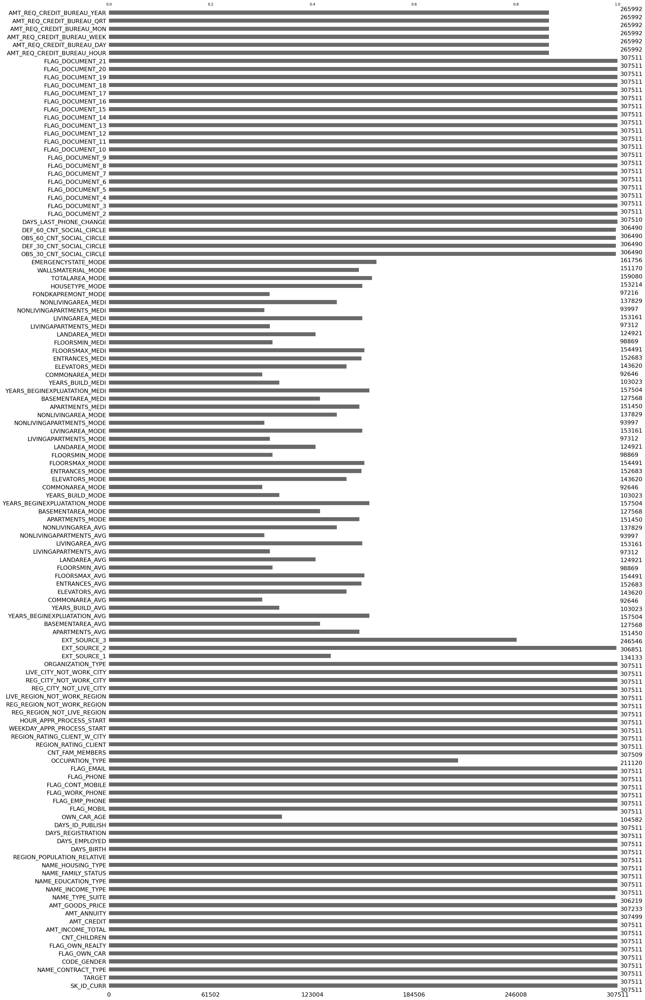

In [20]:
description_dataset(train, "train data")

<Axes: title={'center': 'Répartition des types de colonnes'}, ylabel='count'>

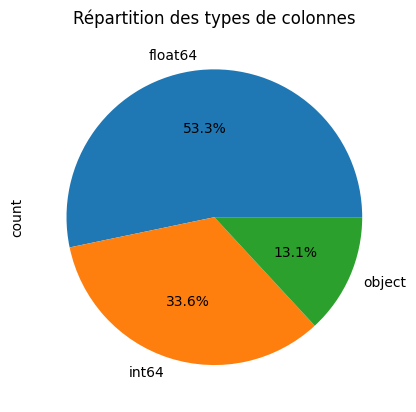

In [21]:
train.dtypes.value_counts().plot(kind='pie',autopct="%1.1f%%", title = "Répartition des types de colonnes")

On observe plusieurs colonnes de type binaires soit numériques soit catégorielles. Des informations qui vont de la composition de la famille du client à son type de résidence et ses posséssions( voiture etc...). Nous avons aussi des information sur ses précédents prêts.  
La variable CODE_GENDER possede la valeur XNA en plus des deux autres genre.  
La variable TARGET qui indique si un prêt à été remboursé sans incidents ou non est présente.  
Les noms des variables catégorielles comporte des majuscules, minuscules et caractères spéciaux.  

## 2.3.1 Etude de la TARGET

In [22]:
train['TARGET'].value_counts()/len(train)*100

TARGET
0    91.927118
1     8.072882
Name: count, dtype: float64

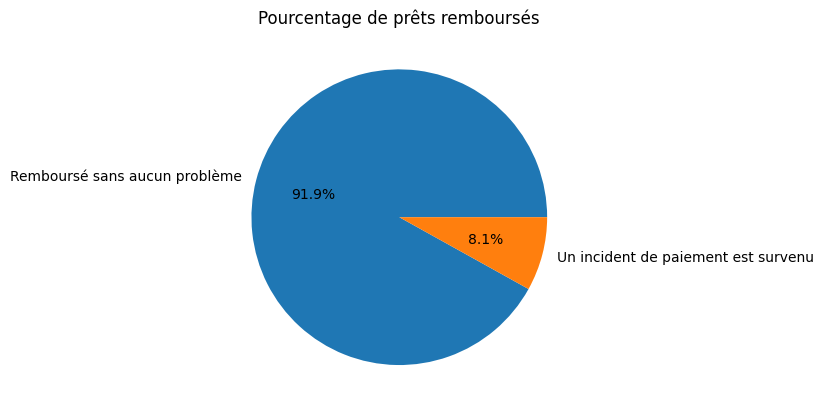

In [23]:
fig = plt.figure()
plt.pie(train['TARGET'].value_counts()/len(train)*100,
        autopct='%1.1f%%',
        labels=["Remboursé sans aucun problème", "Un incident de paiement est survenu"]
       )
plt.title('Pourcentage de prêts remboursés')
plt.show()

On remarque que les catégories sont trés déséquilibrées.

# 2.4 Test

On traite le dataset  Test Data


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,Unaccompanied,Working,Higher education,Married,House / apartment,0.018850,-19241,-2329,-5170.0,-812,NaN,1,1,0,1,0,1,NaN,2.0,2,2,TUESDAY,18,0,0,0,0,0,0,Kindergarten,0.752614,0.789654,0.159520,0.066,0.059,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0505,NaN,NaN,0.0672,0.0612,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0526,NaN,NaN,0.0666,0.059,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0514,NaN,NaN,NaN,block of flats,0.0392,"Stone, brick",No,0.0,0.0,0.0,0.0,-1740.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.035792,-18064,-4469,-9118.0,-1623,NaN,1,1,0,1,0,0,Low-skill Laborers,2.0,2,2,FRIDAY,9,0,0,0,0,0,0,Self-employed,0.564990,0.291656,0.432962,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,NaN,Working,Higher education,Married,House / apartment,0.019101,-20038,-4458,-2175.0,-3503,5.0,1,1,0,1,0,0,Drivers,2.0,2,2,MONDAY,14,0,0,0,0,0,0,Transport: type 3,NaN,0.699787,0.610991,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-856.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0


Taille :-------------------------------------------------------------- (48744, 121)
----------------------------------------------------------------------------------------------------
Valeurs manquantes par colonnes (%): 
Durée d'exécution de missing_values: 0.031327009201049805s


,Valeurs manquantes,% total des valeurs
COMMONAREA_MODE,33495,68.7
COMMONAREA_MEDI,33495,68.7
COMMONAREA_AVG,33495,68.7
NONLIVINGAPARTMENTS_MEDI,33347,68.4
NONLIVINGAPARTMENTS_AVG,33347,68.4
NONLIVINGAPARTMENTS_MODE,33347,68.4
FONDKAPREMONT_MODE,32797,67.3
LIVINGAPARTMENTS_MODE,32780,67.2
LIVINGAPARTMENTS_MEDI,32780,67.2
LIVINGAPARTMENTS_AVG,32780,67.2


----------------------------------------------------------------------------------------------------
Valeurs différentes par variables : 
SK_ID_CURR------------------------------------------------------------ contient 48744 valeurs différentes
NAME_CONTRACT_TYPE---------------------------------------------------- ['Cash loans' 'Revolving loans']
CODE_GENDER----------------------------------------------------------- ['F' 'M']
FLAG_OWN_CAR---------------------------------------------------------- ['N' 'Y']
FLAG_OWN_REALTY------------------------------------------------------- ['Y' 'N']
CNT_CHILDREN---------------------------------------------------------- [ 0  2  1  3  8  4  6  5  7 20 11]
AMT_INCOME_TOTAL------------------------------------------------------ contient 606 valeurs différentes
AMT_CREDIT------------------------------------------------------------ contient 2937 valeurs différentes
AMT_ANNUITY----------------------------------------------------------- contient 7491 valeurs d

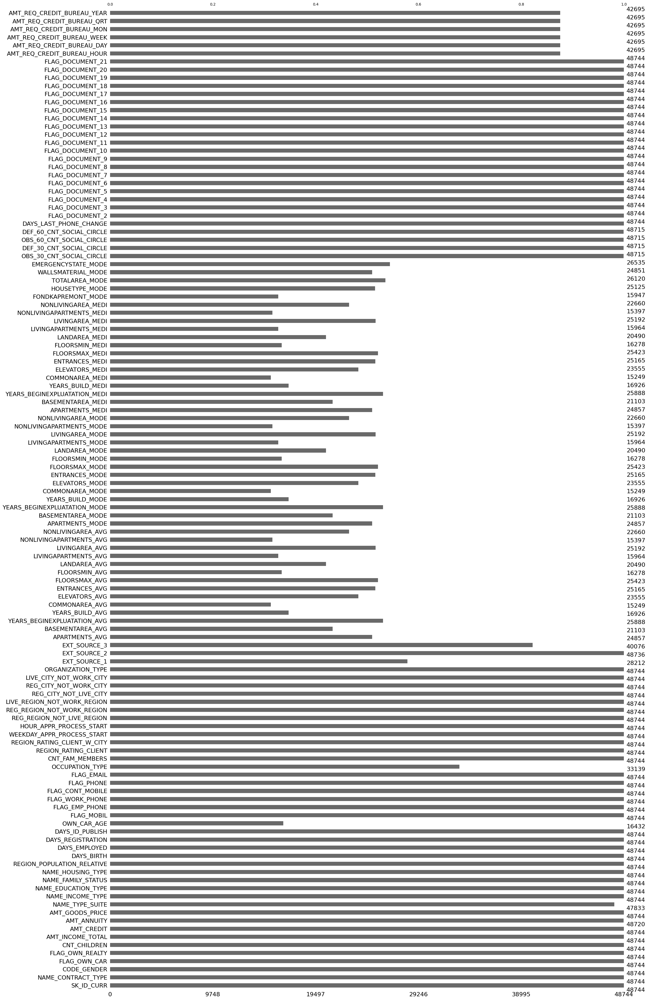

In [24]:
description_dataset(test, "Test Data")

<Axes: title={'center': 'Répartition des types de colonnes'}, ylabel='count'>

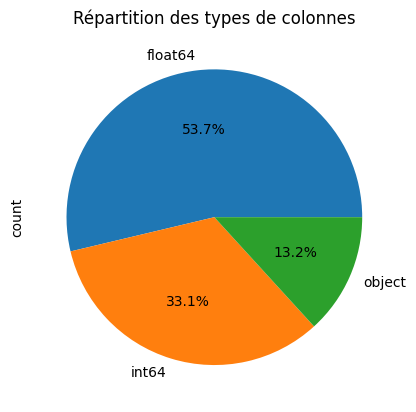

In [25]:
test.dtypes.value_counts().plot(kind='pie',autopct="%1.1f%%", title = "Répartition des types de colonnes")

# 3. Cleaning

In [26]:
train.CODE_GENDER.value_counts()

CODE_GENDER
F      202448
M      105059
XNA         4
Name: count, dtype: int64

In [27]:
train = train[train.CODE_GENDER != 'XNA']

In [28]:
# Supprime les individus dont 'NAME_INCOME_TYPE' vient d'un congé maternité car cas inexistant dans test et 5 occurences 
train = train[train.NAME_INCOME_TYPE != 'Maternity leave']

In [29]:
# Supprime les individus dont la statut familial est inconnu
train = train[train['NAME_FAMILY_STATUS'] != 'Unknown']

In [30]:
cols_to_clean = ["NAME_CONTRACT_TYPE",
        "NAME_TYPE_SUITE",
        "OCCUPATION_TYPE",
        "WALLSMATERIAL_MODE",
        "HOUSETYPE_MODE",
        "NAME_HOUSING_TYPE",
        "NAME_FAMILY_STATUS"]

In [31]:
for cols in cols_to_clean: 
    train[cols] = train[cols].apply(lambda x : cleaning_categories(x))

In [32]:
for cols in cols_to_clean: 
    test[cols] = test[cols].apply(lambda x : cleaning_categories(x))

## 3.1 Outliers

In [33]:
train.iloc[:, 1:].describe().T

,count,mean,std,min,25%,50%,75%,max
TARGET,307500.0,0.080725,0.272413,0.000000e+00,0.000000,0.000000,0.000000,1.000000e+00
CNT_CHILDREN,307500.0,0.417034,0.722108,0.000000e+00,0.000000,0.000000,1.000000,1.900000e+01
AMT_INCOME_TOTAL,307500.0,168797.123450,237126.307223,2.565000e+04,112500.000000,147150.000000,202500.000000,1.170000e+08
AMT_CREDIT,307500.0,599025.945351,402493.590146,4.500000e+04,270000.000000,513531.000000,808650.000000,4.050000e+06
AMT_ANNUITY,307488.0,27108.477604,14493.600189,1.615500e+03,16524.000000,24903.000000,34596.000000,2.580255e+05
AMT_GOODS_PRICE,307224.0,538394.285593,369445.877860,4.050000e+04,238500.000000,450000.000000,679500.000000,4.050000e+06
REGION_POPULATION_RELATIVE,307500.0,0.020868,0.013831,2.900000e-04,0.010006,0.018850,0.028663,7.250800e-02
DAYS_BIRTH,307500.0,-16037.069246,4363.988872,-2.522900e+04,-19682.000000,-15750.000000,-12413.000000,-7.489000e+03
DAYS_EMPLOYED,307500.0,63817.429333,141277.730537,-1.791200e+04,-2760.000000,-1213.000000,-289.000000,3.652430e+05
DAYS_REGISTRATION,307500.0,-4986.152449,3522.883278,-2.467200e+04,-7479.250000,-4504.000000,-2010.000000,0.000000e+00


Les jours sont négatifs pour les variables DAYS_
Un ou plusieurs véhicules ont 91 ans

In [34]:
train.OWN_CAR_AGE.value_counts().sort_index(ascending = False).head(20)

OWN_CAR_AGE
91.0       2
69.0       1
65.0     891
64.0    2443
63.0       2
57.0       1
56.0       1
55.0       4
54.0      12
52.0       1
51.0       3
50.0       1
49.0       6
48.0       1
47.0       1
46.0       5
45.0      11
44.0      21
43.0      19
42.0      42
Name: count, dtype: int64

Plusieurs véhicules ont 64 ans, ou même sont plus vieux. Cela peut être des véhicules de collections ou tres bien entretenus.

In [35]:
(train['DAYS_BIRTH'] / -365).describe()

count    307500.000000
mean         43.937176
std          11.956134
min          20.517808
25%          34.008219
50%          43.150685
75%          53.923288
max          69.120548
Name: DAYS_BIRTH, dtype: float64

L'âge maximal est 69 et le minimal es 20 ans, il n'y a pas d'outliers.

In [36]:
print("Nombre maximal de jours où le client occupe son poste actuel précédents la demande :",train['DAYS_EMPLOYED'].max())

Nombre maximal de jours où le client occupe son poste actuel précédents la demande : 365243


Cela correspondrait à 1000 ans, il est clair que c'est un outlier.

Text(0.5, 0, 'Days Employment')

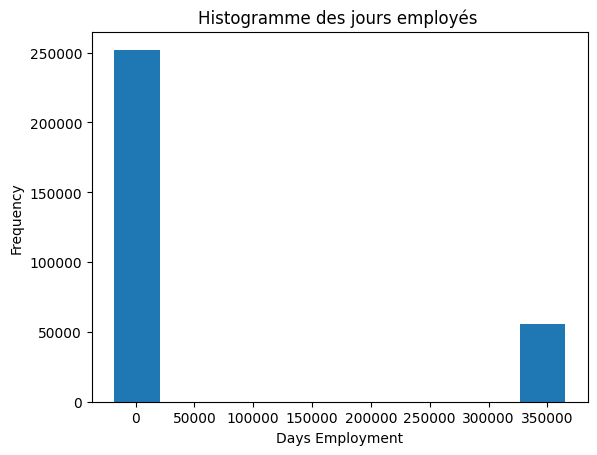

In [37]:
train['DAYS_EMPLOYED'].plot.hist(title = 'Histogramme des jours employés ');
plt.xlabel('Days Employment')

In [38]:
#identification des valeurs anormales et non anormales
anom = train[train['DAYS_EMPLOYED'] == 365243]
non_anom = train[train['DAYS_EMPLOYED'] != 365243]
print('La valeur par défaut des non-anomalies sur le %0.2f%% de prêts' % (100 * non_anom['TARGET'].mean()))
print('La valeur par défaut des anomalies sur le %0.2f%% de prêts' % (100 * anom['TARGET'].mean()))
print('Il y a %d outliers dans la variable days of employment' % len(anom))

La valeur par défaut des non-anomalies sur le 8.66% de prêts
La valeur par défaut des anomalies sur le 5.40% de prêts
Il y a 55374 outliers dans la variable days of employment


L'une des approches les plus sûres consiste à définir les anomalies comme des valeurs manquantes, puis à les compléter (en utilisant
l'imputation) avant l'apprentissage automatique. Nous allons remplir les valeurs anormales avec un nombre nul (np.nan) et ensuite créer une nouvelle colonne booléenne indiquant si la valeur était anormale ou non

Text(0.5, 0, 'Days Employment')

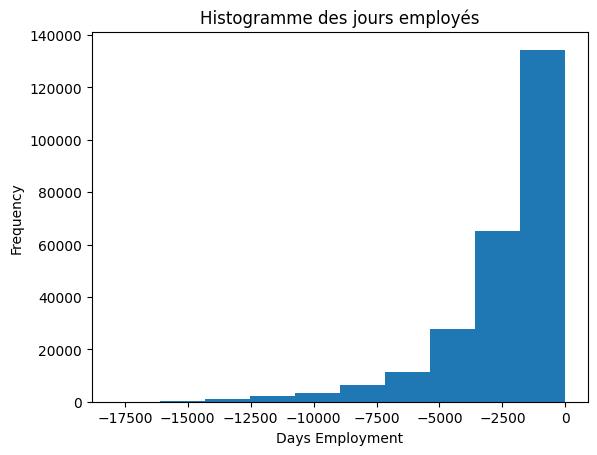

In [39]:
#Création d'une colonne avec le label d'anomalie
train['DAYS_EMPLOYED_ANOM'] = train["DAYS_EMPLOYED"] == 365243

#On remplace les outliers par des nan
train['DAYS_EMPLOYED'].replace({365243: np.nan}, inplace = True)

train['DAYS_EMPLOYED'].plot.hist(title = 'Histogramme des jours employés');
plt.xlabel('Days Employment')

In [40]:
test.describe()

,SK_ID_CURR,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,48744.000000,48744.000000,4.874400e+04,4.874400e+04,48720.000000,4.874400e+04,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,16432.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,28212.000000,48736.000000,40076.000000,24857.000000,21103.000000,25888.000000,16926.000000,15249.000000,23555.000000,25165.000000,25423.000000,16278.000000,20490.000000,15964.000000,25192.000000,15397.000000,22660.000000,24857.000000,21103.000000,25888.000000,16926.000000,15249.000000,23555.000000,25165.000000,25423.000000,16278.000000,20490.000000,15964.000000,25192.000000,15397.000000,22660.000000,24857.000000,21103.000000,25888.000000,16926.000000,15249.000000,23555.000000,25165.000000,25423.000000,16278.000000,20490.000000,15964.000000,25192.000000,15397.000000,22660.000000,26120.000000,48715.000000,48715.000000,48715.000000,48715.000000,48744.000000,48744.0,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.0,48744.000000,48744.0,48744.0,48744.0,48744.0,48744.0,48744.0,48744.000000,48744.0,48744.0,48744.0,42695.000000,42695.000000,42695.000000,42695.000000,42695.000000,42695.000000
mean,277796.676350,0.397054,1.784318e+05,5.167404e+05,29426.240209,4.626188e+05,0.021226,-16068.084605,67485.366322,-4967.652716,-3051.712949,11.786027,0.999979,0.809720,0.204702,0.998400,0.263130,0.162646,2.146767,2.038159,2.012596,12.007365,0.018833,0.055166,0.042036,0.077466,0.224664,0.174216,0.501180,0.518021,0.500106,0.122388,0.090065,0.978828,0.751137,0.047624,0.085168,0.151777,0.233706,0.238423,0.067192,0.105885,0.112286,0.009231,0.029387,0.119078,0.088998,0.978292,0.758327,0.045223,0.080570,0.147161,0.229390,0.233854,0.065914,0.110874,0.110687,0.008358,0.028161,0.122809,0.089529,0.978822,0.754344,0.047420,0.084128,0.151200,0.233154,0.237846,0.068069,0.107063,0.113368,0.008979,0.029296,0.107129,1.447644,0.143652,1.435738,0.101139,-1077.766228,0.0,0.786620,

In [41]:
test['DAYS_EMPLOYED_ANOM'] = test["DAYS_EMPLOYED"] == 365243
test["DAYS_EMPLOYED"].replace({365243: np.nan}, inplace = True)

print("Il y a % d'erreurs sur le nombre de jours en emploi du client dans le dataset de test parmis %d de valeurs" % (test["DAYS_EMPLOYED_ANOM"].sum(), len(test)))

Il y a  9274'erreurs sur le nombre de jours en emploi du client dans le dataset de test parmis 48744 de valeurs


## 3.2 Corrélations

In [42]:
#Trouvons les corrélations avec la target et trions les 
numeric_train = train.select_dtypes(include='number')
correlations = numeric_train.corr()['TARGET'].sort_values()

In [43]:
# Display correlations
print('Most Positive Correlations:\n', correlations.tail(15))
print('\nMost Negative Correlations:\n', correlations.head(15))

Most Positive Correlations:
 DEF_30_CNT_SOCIAL_CIRCLE       0.032244
LIVE_CITY_NOT_WORK_CITY        0.032500
OWN_CAR_AGE                    0.037625
DAYS_REGISTRATION              0.041950
FLAG_DOCUMENT_3                0.044371
REG_CITY_NOT_LIVE_CITY         0.044401
FLAG_EMP_PHONE                 0.045978
REG_CITY_NOT_WORK_CITY         0.050981
DAYS_ID_PUBLISH                0.051455
DAYS_LAST_PHONE_CHANGE         0.055228
REGION_RATING_CLIENT           0.058882
REGION_RATING_CLIENT_W_CITY    0.060875
DAYS_EMPLOYED                  0.074973
DAYS_BIRTH                     0.078236
TARGET                         1.000000
Name: TARGET, dtype: float64

Most Negative Correlations:
 EXT_SOURCE_3                 -0.178926
EXT_SOURCE_2                 -0.160451
EXT_SOURCE_1                 -0.155333
FLOORSMAX_AVG                -0.044005
FLOORSMAX_MEDI               -0.043770
FLOORSMAX_MODE               -0.043228
AMT_GOODS_PRICE              -0.039671
REGION_POPULATION_RELATIVE   -0.037223


La corrélation DAYS_BIRTH est la plus positive.
La corrélation est positive, mais la valeur de cette caractéristique est en fait négative, ce qui signifie que plus le client vieillit, moins il est susceptible de ne pas rembourser son prêt (c'est-à-dire que la cible == 0).
C'est un peu déroutant, nous allons donc prendre la valeur absolue de la caractéristique et la corrélation sera alors négative.

In [44]:
# Find the correlation of the positive days since birth and target
train['DAYS_BIRTH'] = abs(train['DAYS_BIRTH'])
print("Corrélation entre l'âge du client au moment du prêt et la TARGET :", train['DAYS_BIRTH'].corr(train['TARGET']))

Corrélation entre l'âge du client au moment du prêt et la TARGET : -0.07823618230487006


Plus les clients vieillissent, plus ils ont tendance à rembourser leurs prêts dans les délais.

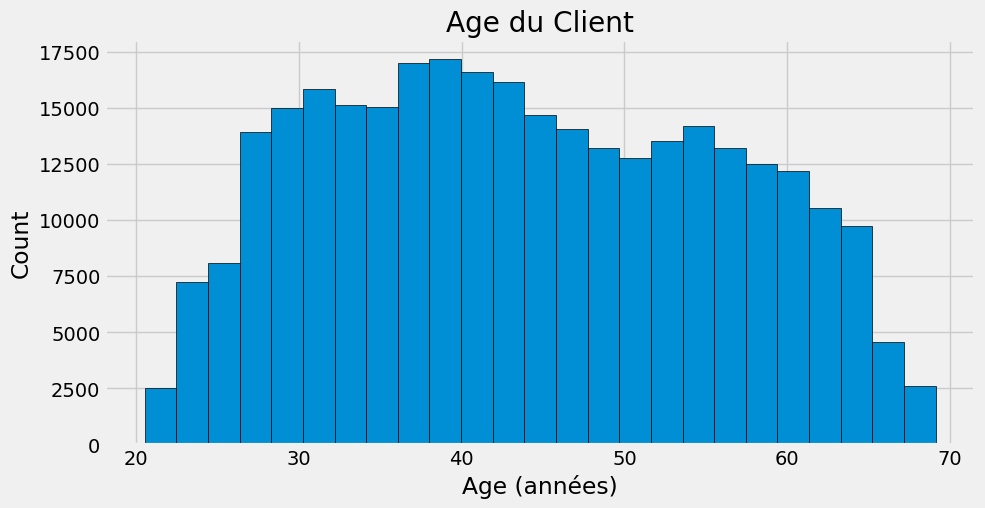

In [45]:
# choix du style du tracé
plt.style.use('fivethirtyeight')

# Tracé de la distribution des ages
plt.figure(figsize=(10,5))
plt.hist(train['DAYS_BIRTH'] / 365, edgecolor = 'k', bins = 25)
plt.title('Age du Client'); plt.xlabel('Age (années)'); plt.ylabel('Count');

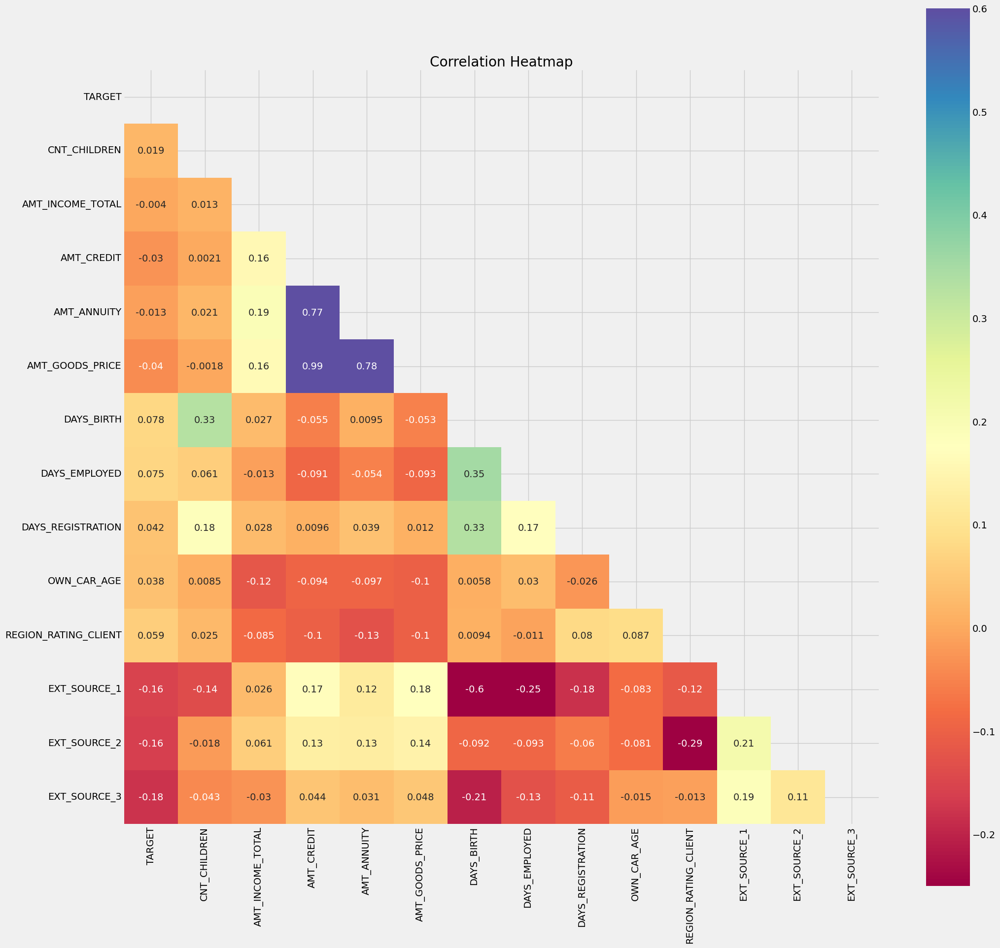

In [46]:
ext_data = numeric_train[['TARGET',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'OWN_CAR_AGE',
 'REGION_RATING_CLIENT',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3']]

plt.figure(figsize = (22, 22))
mask = np.triu(np.ones_like(ext_data.corr()))
    
# Heatmap of correlations
sns.heatmap(ext_data.corr(),mask = mask, cmap = plt.cm.Spectral,square=True, vmin = -0.25, annot = True, vmax = 0.6)
plt.title('Correlation Heatmap');

## 3.3 Features engineering

Création de nouvelles variables simples  
Catégorisation des variables binaires  
Imputation des valeurs manquantes  
Encodage des variables catégorielles  
Normalisation des variables numériques

In [47]:
train.reset_index(drop=True, inplace=True)
test.reset_index(drop=True, inplace=True)


df_train = train.copy()
df_test = test.copy()

In [48]:
#Récupération des identifiants clients et des labels 
train_ids = df_train["SK_ID_CURR"]
test_ids = df_test["SK_ID_CURR"]

labels = df_train.TARGET

In [49]:
features_set, test_features_set = clean_data(df_train,df_test)

Durée d'exécution de cat_encoder: 1.1150929927825928s
Training Data Shape:  (307500, 261)
Testing Data Shape:  (48744, 260)
Durée d'exécution de clean_data: 12.520717859268188s


In [50]:
features_set = features_set.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))
test_features_set = test_features_set.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))

In [51]:
test_features = test_features_set.reset_index()
test_features.to_csv("test_preprocess.csv", index=False)
# Sauvegarde de test_set nettoyé
pickle.dump(test_features_set, open( "test_preprocess.p", "wb"))
    
# Sauvegarde de train_set nettoyé
with open('fichier_train_preprocess.pickle', 'wb') as fichier:
    pickle.dump(features_set, fichier, pickle.HIGHEST_PROTOCOL)

# 4. Modélisation

# 4.1 Préparation des données pour la modélisation

In [52]:
df_X = features_set.drop(columns = 'TARGET')
df_y = features_set['TARGET']
train_set, val_set, train_labels, val_labels = echantillonage(df_X,df_y)

Durée d'exécution de echantillonage: 0.6279489994049072s


In [53]:
train_set['TARGET']=train_labels
val_set['TARGET']=val_labels

In [54]:
train_set = train_set.reset_index()

Création d'échantillons pour les divers tests d'algorithmes

In [55]:
sample_X = features_set.drop(columns = 'TARGET').sample(n= 50000)
sample_y = features_set['TARGET'][sample_X.index]

train_sample_set, val_sample_set, train_sample_labels, val_sample_labels = echantillonage(sample_X,sample_y)

Durée d'exécution de echantillonage: 0.05121493339538574s


In [56]:
train_sample_set['TARGET']=train_sample_labels
val_sample_set['TARGET']=val_sample_labels


train_sample_set = train_sample_set.reset_index()

In [57]:
print('train shape :',train_set.shape)
print('validation shape :',val_set.shape)


print('train sample shape :',train_sample_set.shape)
print('validation sample shape :',val_sample_set.shape)

train shape : (246000, 262)
validation shape : (61500, 261)
train sample shape : (40000, 262)
validation sample shape : (10000, 261)


In [58]:
#sauvegarde des train set et val set
pickle.dump( train_set, open( "train_set.p", "wb" ) )
pickle.dump( val_set, open( "val_set.p", "wb" ) )

In [59]:
#chargement des train set et val set 
train_set = pickle.load( open( "train_set.p", "rb" ) )
val_set = pickle.load( open( "val_set.p", "rb" ) )

# 4.2 Évaluation initiale des modèles

In [60]:
# Dictionnaire de classifieurs 
classifieurs = {
    'Dummy Classifier': DummyClassifier(),
    'Logistic Regression': LogisticRegression(solver='lbfgs', max_iter=1000),
    'LGBM': lgb.LGBMClassifier(force_row_wise=True, verbose=-1)
}

Dummy Classifier
Logistic Regression
LGBM


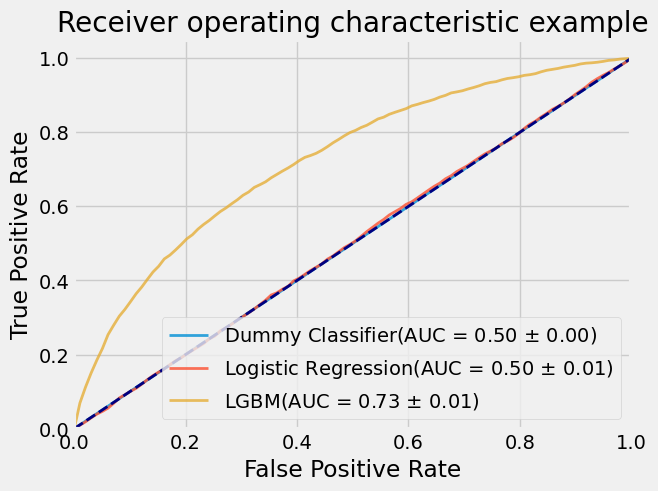

Durée d'exécution de plot_roc_curve: 5.2451560497283936s


In [61]:
plot_roc_curve(classifieurs,train_sample_set.drop(columns = 'TARGET'),train_sample_labels, n_splits = 5)

Nous allons choisir le LGBM pour notre probleme. Afin de discriminer correctement les Faux négatifs nous créons une fonction cout métier, qui pondère chaque faux négatif à -10

# 4.3 Rééquilibrage et choix du modèle

# 4.3.1 Class Weight

In [62]:
#Class Weight
best_par_0, feat_imp_0, model_0 = optimisation_model(train_sample_set, lgb.LGBMClassifier(verbose=-1),metric = cout_metier, n_ite_baye=5)

100%|██████████| 5/5 [03:39<00:00, 43.87s/trial, best loss: 0.13070382642494616]
Durée d'exécution de optimisation_model: 233.82167220115662s


In [63]:
best_par_0

{'colsample_by_tree': 0.7000000000000001,
 'learning_rate': 0.013189774646487877,
 'max_depth': 6.0,
 'n_estimators': 1800.0,
 'num_leaves': 72.0,
 'reg_alpha': 0.4,
 'reg_lambda': 0.2,
 'seuil': 0.8,
 'subsample': 0.8}

Durée d'exécution de gain_seuil: 43.745276927948s


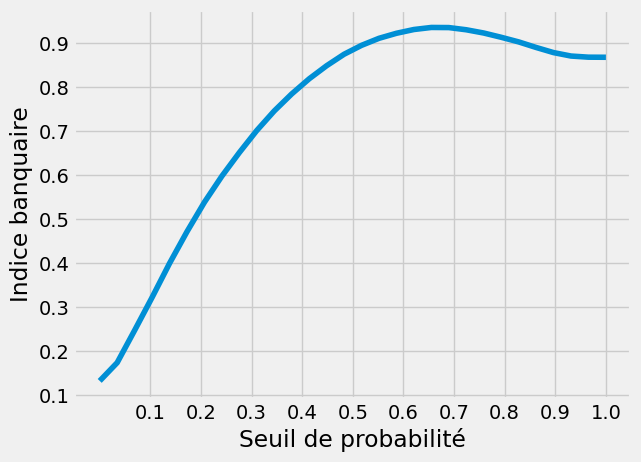

In [64]:
gain_seuil(model_0, train_sample_labels, train_sample_set.drop(columns = ['TARGET','SK_ID_CURR']))

In [65]:
y_proba = model_0.predict_proba(val_sample_set.drop(columns = ['TARGET']))[:, 1]
y_pred_proba = y_proba > best_par_0['seuil']
y_pred_proba = np.array(y_pred_proba > 0)*1

# Si proba > seuil alors la prédiction est positive : 1
score= roc_auc_score(val_sample_labels,y_pred_proba)

print ("ROC auc score : ",score)
print("métrique métier : ",cout_metier(val_sample_labels,y_pred_proba))

ROC auc score :  0.5304311109962171
métrique métier :  0.8676928153875166


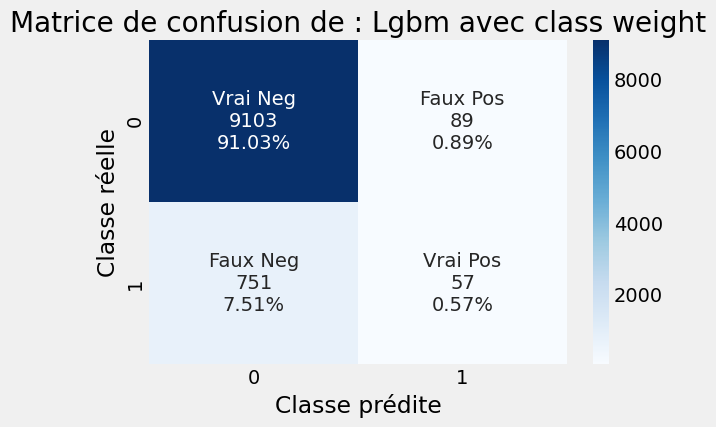

Durée d'exécution de afficher_matrice_confusion: 0.11868119239807129s


In [66]:
afficher_matrice_confusion(val_sample_labels,y_pred_proba, "Lgbm avec class weight")

# 4.3.2 Smote

In [67]:
#Smote ou oversampling
best_par_smote, feat_imp_smote, model_smote = optimisation_model(train_sample_set, lgb.LGBMClassifier(verbose=-1),metric = cout_metier,smote = True, n_ite_baye=5)

100%|██████████| 5/5 [09:48<00:00, 117.64s/trial, best loss: 0.1308443608740999]
Durée d'exécution de optimisation_model: 589.2693741321564s


In [68]:
best_par_smote

{'colsample_by_tree': 0.7000000000000001,
 'learning_rate': 0.16639439533473604,
 'max_depth': 22.0,
 'n_estimators': 200.0,
 'num_leaves': 16.0,
 'reg_alpha': 0.1,
 'reg_lambda': 0.7000000000000001,
 'seuil': 0.47500000000000003,
 'subsample': 0.6000000000000001}

Durée d'exécution de gain_seuil: 4.157170057296753s


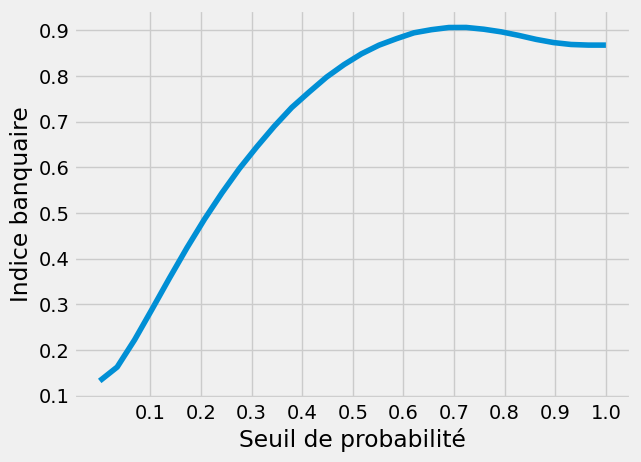

In [69]:
gain_seuil(model_smote, train_sample_labels, train_sample_set.drop(columns = ["SK_ID_CURR",'TARGET']))

In [70]:
y_proba_smote = model_smote.predict_proba(val_sample_set.drop(columns = ['TARGET']))[:, 1]
y_pred_proba_smote = y_proba_smote > best_par_smote['seuil']
y_pred_proba_smote = np.array(y_pred_proba_smote > 0)*1

# Si proba > seuil alors la prédiction est positive : 1
score_smote= roc_auc_score(val_sample_labels,y_pred_proba_smote)

print ("ROC auc score : ",score_smote)
print("métrique métier : ",cout_metier(val_sample_labels,y_pred_proba_smote))

ROC auc score :  0.6655884583236392
métrique métier :  0.7479964171223836


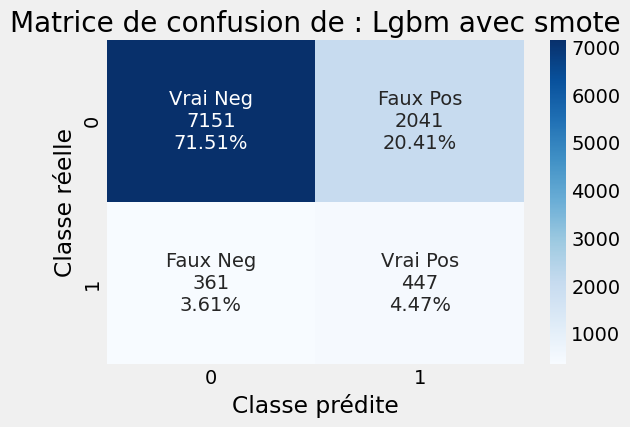

Durée d'exécution de afficher_matrice_confusion: 0.08499002456665039s


In [71]:
afficher_matrice_confusion(val_sample_labels,y_pred_proba_smote, "Lgbm avec smote")

# 4.3.3 UnderSampling

In [72]:
best_parameters_us, feature_importance_us, model_us = optimisation_model(train_sample_set, lgb.LGBMClassifier(verbose=-1),
                                                                             metric=cout_metier, under=True,
                                                                             n_ite_baye=5
                                                                             )

100%|███████████| 5/5 [02:39<00:00, 31.84s/trial, best loss: 0.1387002096631219]
Durée d'exécution de optimisation_model: 177.46528100967407s


In [73]:
best_parameters_us

{'colsample_by_tree': 1.0,
 'learning_rate': 0.0077246827564601645,
 'max_depth': 26.0,
 'n_estimators': 1400.0,
 'num_leaves': 60.0,
 'reg_alpha': 1.0,
 'reg_lambda': 0.30000000000000004,
 'seuil': 0.875,
 'subsample': 0.2}

Durée d'exécution de gain_seuil: 35.061973094940186s


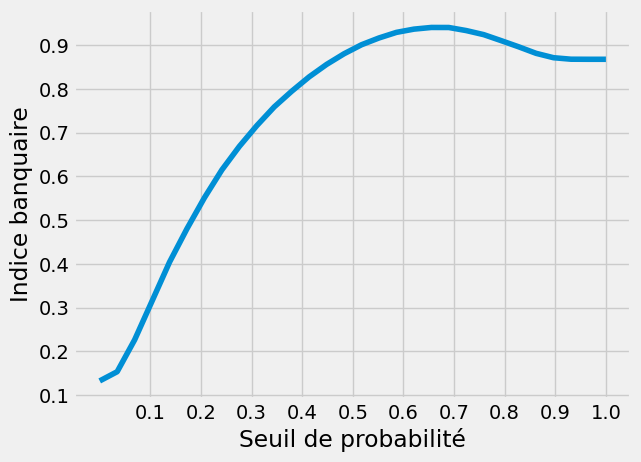

In [74]:
gain_seuil(model_us, train_sample_labels, train_sample_set.drop(columns = ["SK_ID_CURR",'TARGET']))

In [75]:
y_proba_us = model_us.predict_proba(val_sample_set.drop(columns = ['TARGET']))[:, 1]
y_pred_proba_us = y_proba_us > best_parameters_us['seuil']
y_pred_proba_us = np.array(y_pred_proba_us > 0)*1

# Si proba > seuil alors la prédiction est positive : 1
score_us= roc_auc_score(val_sample_labels,y_pred_proba_us)

print ("ROC auc score : ",score_us)
print("métrique métier : ",cout_metier(val_sample_labels,y_pred_proba_us))

ROC auc score :  0.5033865005299486
métrique métier :  0.8671035263058646


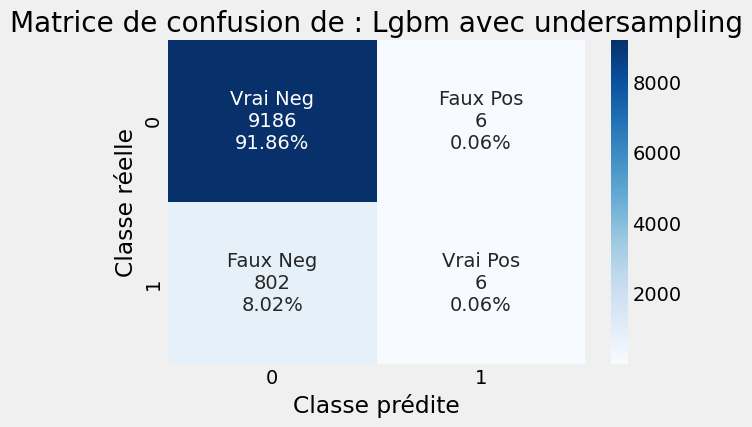

Durée d'exécution de afficher_matrice_confusion: 0.07906413078308105s


In [76]:
afficher_matrice_confusion(val_sample_labels,y_pred_proba_us, "Lgbm avec undersampling")

In [77]:
#Dictionnaire de modèles
dict_model={'class_weight':model_0,
            'Over_sampling':model_smote,
            'Under_sampling':model_us
           }

name,score, target_0, target_1=score_validation_set(dict_model)

val_list={'Sampling':'True_val',
          'Pred_0':(val_sample_set['TARGET'].value_counts()/len(val_sample_set)*100)[0].item(),
          'Pred_1':(val_sample_set['TARGET'].value_counts()/len(val_sample_set)*100)[1].item()}

df_score=pd.DataFrame()
df_score['Sampling']=name
df_score['metrique metier']=score
df_score['Pred_0']=target_0
df_score['Pred_1']=target_1
df_score

,Sampling,metrique metier,Pred_0,Pred_1
0,class_weight,0.852067,82.900813,17.099187
1,Over_sampling,0.810957,78.785366,21.214634
2,Under_sampling,0.855966,82.778862,17.221138


In [78]:
df_score['metrique metier']=df_score['metrique metier']*100
df_score.loc[3] = val_list
df_score

,Sampling,metrique metier,Pred_0,Pred_1
0,class_weight,85.206720,82.900813,17.099187
1,Over_sampling,81.095688,78.785366,21.214634
2,Under_sampling,85.596642,82.778862,17.221138
3,True_val,NaN,91.920000,8.080000


Le modele retenu est celui avec over sampling / smote car minimise le risque de faux négatifs

In [79]:
# Sauvegarde du meilleur modèle dans best_model
fichier_best_model = 'best_model.pickle'
with open(fichier_best_model, 'wb') as fichier:
    pickle.dump(model_smote, fichier, pickle.HIGHEST_PROTOCOL)

# 5. Prédictions sur l'ensemble de test

In [80]:
df_test = test.copy()
df_test['PROPORTION_LIFE_EMPLOYED'] = df_test['DAYS_EMPLOYED'] / df_test['DAYS_BIRTH']
df_test['INCOME_TO_CREDIT_RATIO'] = df_test['AMT_INCOME_TOTAL'] / df_test['AMT_CREDIT']
df_test['INCOME_TO_ANNUITY_RATIO'] = df_test['AMT_INCOME_TOTAL'] / df_test['AMT_ANNUITY']
df_test['INCOME_TO_ANNUITY_RATIO_BY_AGE'] = df_test['INCOME_TO_ANNUITY_RATIO'] * -df_test['DAYS_BIRTH']
df_test['CREDIT_TO_ANNUITY_RATIO'] = df_test['AMT_CREDIT'] / df_train['AMT_ANNUITY']
df_test['CREDIT_TO_ANNUITY_RATIO_BY_AGE'] = df_test['CREDIT_TO_ANNUITY_RATIO'] * -df_test['DAYS_BIRTH']
df_test['INCOME_TO_FAMILYSIZE_RATIO'] = df_test['AMT_INCOME_TOTAL'] / df_test['CNT_FAM_MEMBERS']
df_test['ANNUITY_INCOME_PERC'] = df_test['AMT_ANNUITY'] / df_test['AMT_INCOME_TOTAL']

In [81]:
y_test_pred_proba=model_smote.predict_proba(test_features_set)[:, 1]

seuil=best_par_smote['seuil'] 
y_seuil_test = y_test_pred_proba > seuil
y_seuil_test = np.array(y_seuil_test> 0)*1


df_test_pred=df_test.copy()
df_test_pred['Proba']=y_test_pred_proba
df_test_pred['PREDICTION']=y_seuil_test
df_test_pred.head()

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_EMPLOYED_ANOM,PROPORTION_LIFE_EMPLOYED,INCOME_TO_CREDIT_RATIO,INCOME_TO_ANNUITY_RATIO,INCOME_TO_ANNUITY_RATIO_BY_AGE,CREDIT_TO_ANNUITY_RATIO,CREDIT_TO_ANNUITY_RATIO_BY_AGE,INCOME_TO_FAMILYSIZE_RATIO,ANNUITY_INCOME_PERC,Proba,PREDICTION
0,100001,CASH LOANS,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,UNACCOMPANIED,Working,Higher education,MARRIED,HOUSE APARTMENT,0.018850,-19241,-2329.0,-5170.0,-812,NaN,1,1,0,1,0,1,NAN,2.0,2,2,TUESDAY,18,0,0,0,0,0,0,Kindergarten,0.752614,0.789654,0.159520,0.0660,0.0590,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0505,NaN,NaN,0.0672,0.0612,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0526,NaN,NaN,0.0666,0.0590,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0514,NaN,NaN,NaN,BLOCK OF FLATS,0.0392,"STONE, BRICK",No,0.0,0.0,0.0,0.0,-1740.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,False,0.121044,0.237342,6.565988,126336.178595,23.027874,4.430793e+05,67500.0,0.152300,0.198983,0
1,100005,CASH LOANS,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,UNACCOMPANIED,Working,Secondary / secondary special,MARRIED,HOUSE APARTMENT,0.035792,-18064,-4469.0,-9118.0,-1623,NaN,1,1,0,1,0,0,LOWSKILL LABORERS,2.0,2,2,FRIDAY,9,0,0,0,0,0,0,Self-employed,0.564990,0.291656,0.432962,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NAN,NaN,NAN,NaN,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0,False,0.247398,0.444409,5.699482,102955.440415,6.240262,1.127241e+05,49500.0,0.175455,0.505905,1
2,100013,CASH LOANS,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,NAN,Working,Higher education,MARRIED,HOUSE APARTMENT,0.019101,-20038,-4458.0,-2175.0,-3503,5.0,1,1,0,1,0,0,DRIVERS,2.0,2,2,MONDAY,14,0,0,0,0,0,0,Tran

In [82]:
df_test_pred[df_test_pred.PREDICTION == 1]

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_EMPLOYED_ANOM,PROPORTION_LIFE_EMPLOYED,INCOME_TO_CREDIT_RATIO,INCOME_TO_ANNUITY_RATIO,INCOME_TO_ANNUITY_RATIO_BY_AGE,CREDIT_TO_ANNUITY_RATIO,CREDIT_TO_ANNUITY_RATIO_BY_AGE,INCOME_TO_FAMILYSIZE_RATIO,ANNUITY_INCOME_PERC,Proba,PREDICTION
1,100005,CASH LOANS,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,UNACCOMPANIED,Working,Secondary / secondary special,MARRIED,HOUSE APARTMENT,0.035792,-18064,-4469.0,-9118.0,-1623,NaN,1,1,0,1,0,0,LOWSKILL LABORERS,2.0,2,2,FRIDAY,9,0,0,0,0,0,0,Self-employed,0.564990,0.291656,0.432962,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NAN,NaN,NAN,NaN,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0,False,0.247398,0.444409,5.699482,102955.440415,6.240262,112724.096307,49500.0,0.175455,0.505905,1
4,100038,CASH LOANS,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,UNACCOMPANIED,Working,Secondary / secondary special,MARRIED,HOUSE APARTMENT,0.010032,-13040,-2191.0,-4000.0,-4262,16.0,1,1,1,1,0,0,NAN,3.0,2,2,FRIDAY,5,0,0,0,0,1,1,Business Entity Type 3,0.202145,0.425687,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NAN,NaN,NAN,NaN,0.0,0.0,0.0,0.0,-821.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,False,0.168021,0.287770,5.613247,73196.744317,28.606709,373031.487960,60000.0,0.178150,0.572168,1
25,100172,CASH LOANS,F,N,Y,0,76500.0,225000.0,12334.5,225000.0,UNACCOMPANIED,Working,Secondary / secondary special,CIVIL MARRIAGE,HOUSE APARTMENT,0.010966,-15394,-967.0,-5389.0,-5433,NaN,1,1,0,1,0,0,LABORERS,2.0,2,2,TUESDAY,10,0,0,0,0,1,1,Business Entity Type 3,NaN,0.3

In [83]:
best_par_smote['seuil']

0.47500000000000003

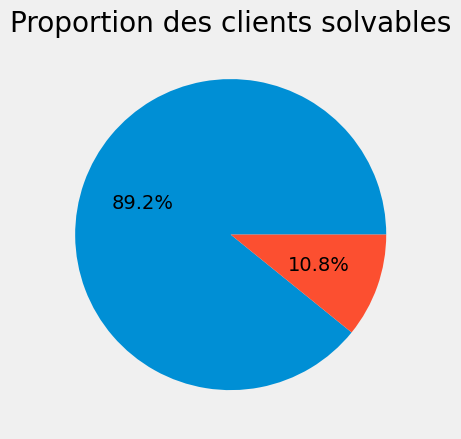

In [84]:
plt.title("Proportion des clients solvables")
plt.pie(df_test_pred["PREDICTION"].value_counts(),
       autopct='%1.1f%%',
       radius=1)
plt.show()

In [85]:
# Sauvegarde des prédictions
fichier_prediction_test = 'test_prediction.pickle'
with open(fichier_prediction_test, 'wb') as fichier:
    pickle.dump(df_test_pred, fichier, pickle.HIGHEST_PROTOCOL)

# 6. Interprétation des modèles avec SHAP

## 6.1 Interprétation globale

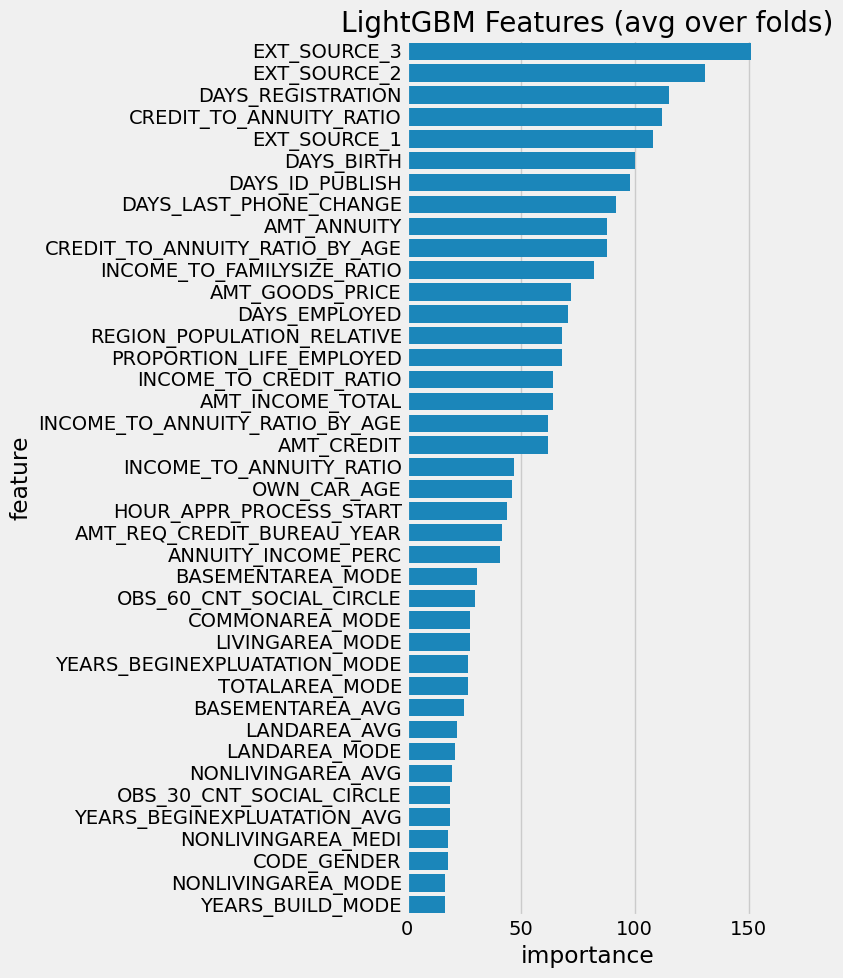

In [86]:
display_importances(feat_imp_smote, train_sample_set)

In [87]:
val_sample_set_t =val_sample_set.drop(columns =["TARGET"])
val_sample_set_0 = val_sample_set_t.reset_index()

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


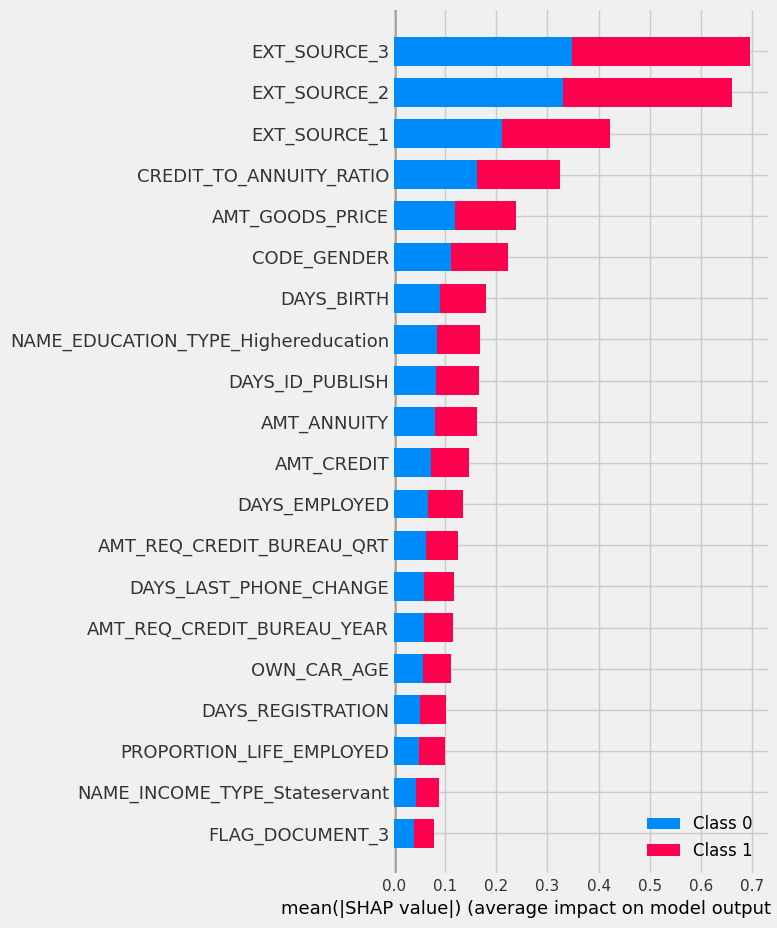

In [88]:
#val_sample_labels = val_sample_labels.astype('float32')
train_sample_labels = train_sample_labels.astype('float32')


explainer_shap = shap.TreeExplainer(model_us)
shap_values = explainer_shap.shap_values(val_sample_set_t)
# Summary plot
shap.summary_plot(shap_values,val_sample_set.drop(columns =["TARGET"]))

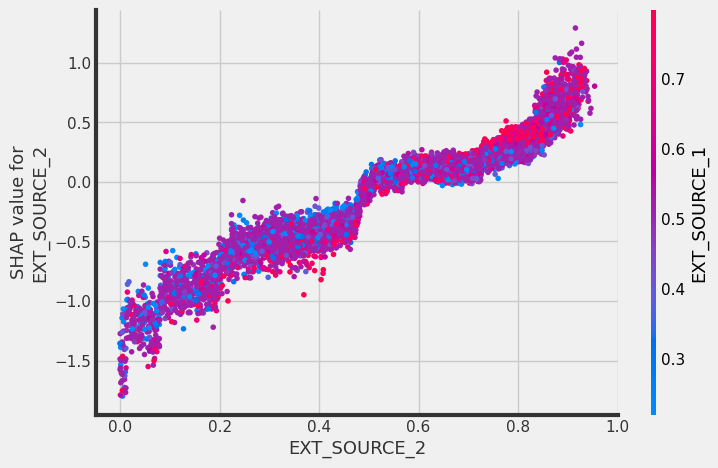

In [89]:
shap.dependence_plot("EXT_SOURCE_2", shap_values[0], val_sample_set.drop(columns =["TARGET"]))

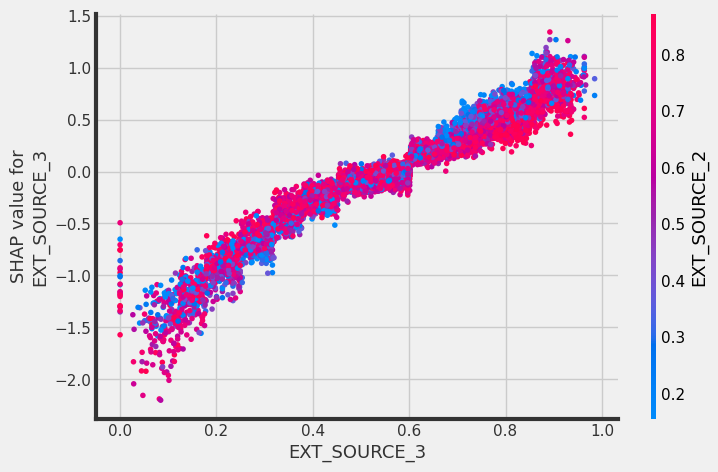

In [90]:
shap.dependence_plot("EXT_SOURCE_3", shap_values[0], val_sample_set.drop(columns =["TARGET"]))

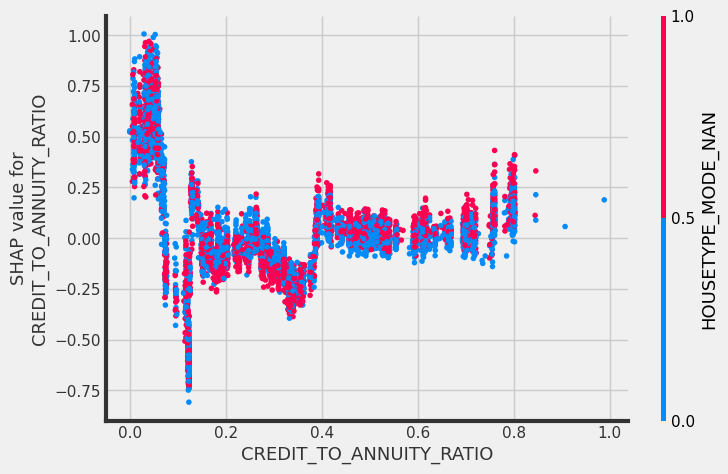

In [91]:
shap.dependence_plot("CREDIT_TO_ANNUITY_RATIO", shap_values[0], val_sample_set.drop(columns =["TARGET"]))

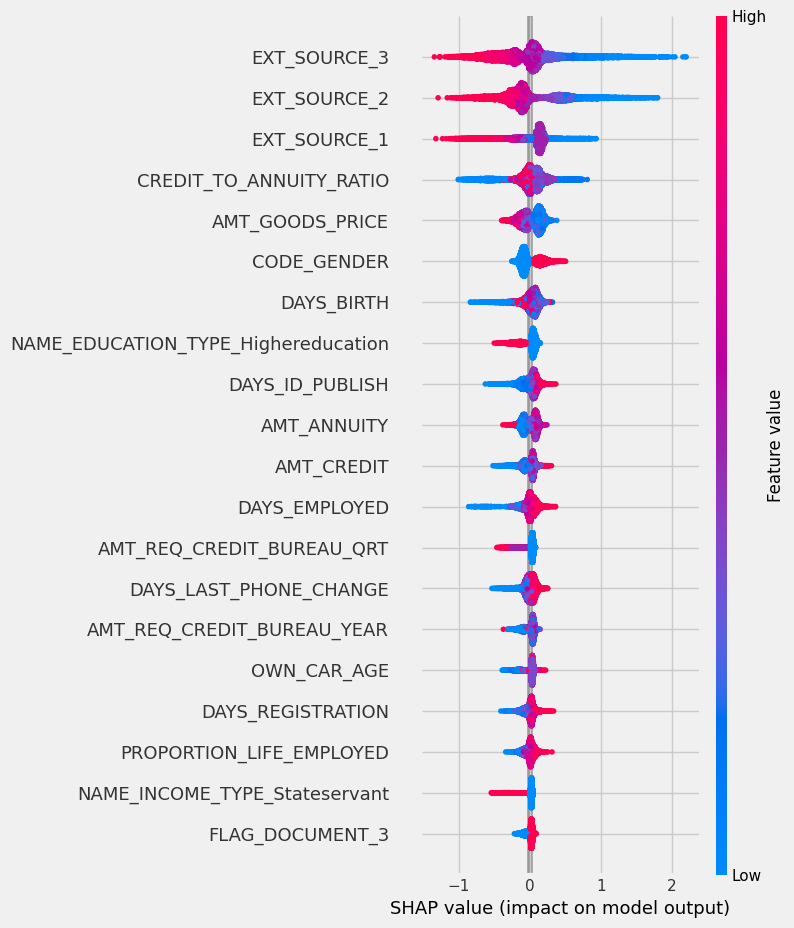

In [92]:
shap.summary_plot(shap_values[1], val_sample_set.drop(columns =["TARGET"]), show=False)

In [93]:
pickle.dump(shap_values, open( "shap_values.p", "wb" ) )

In [94]:
shap_values = pickle.load( open( "shap_values.p", "rb" ) )

## 6.2 Interprétation Locale

In [95]:
shap.initjs()

Client numero :  391200


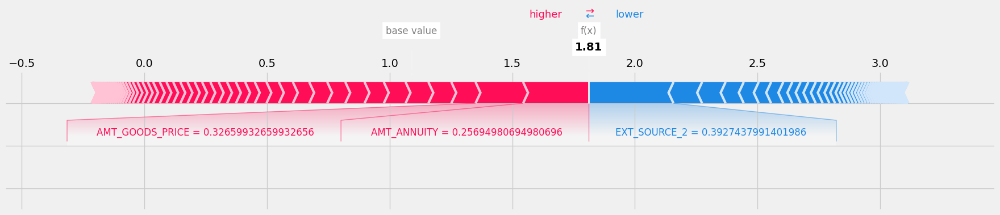

In [96]:
idx = random.randint(1, len(val_sample_set))
print("Client numero : ", val_sample_set_0.iloc[idx,0])

shap.force_plot(explainer_shap.expected_value[0], shap_values[0][idx,:], val_sample_set_t.iloc[idx,:], matplotlib=True)

In [97]:
val_sample_set_0 = val_sample_set_t.reset_index()
idx = random.randint(1, len(val_sample_set))
print("Client numero : ", val_sample_set_0.iloc[idx,0])

shap.force_plot(explainer_shap.expected_value[0], shap_values[0][idx,:], val_sample_set_t.iloc[idx,:])

Client numero :  229581


# 7. Préparation au dashboard : SHAP sur les données de Test

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


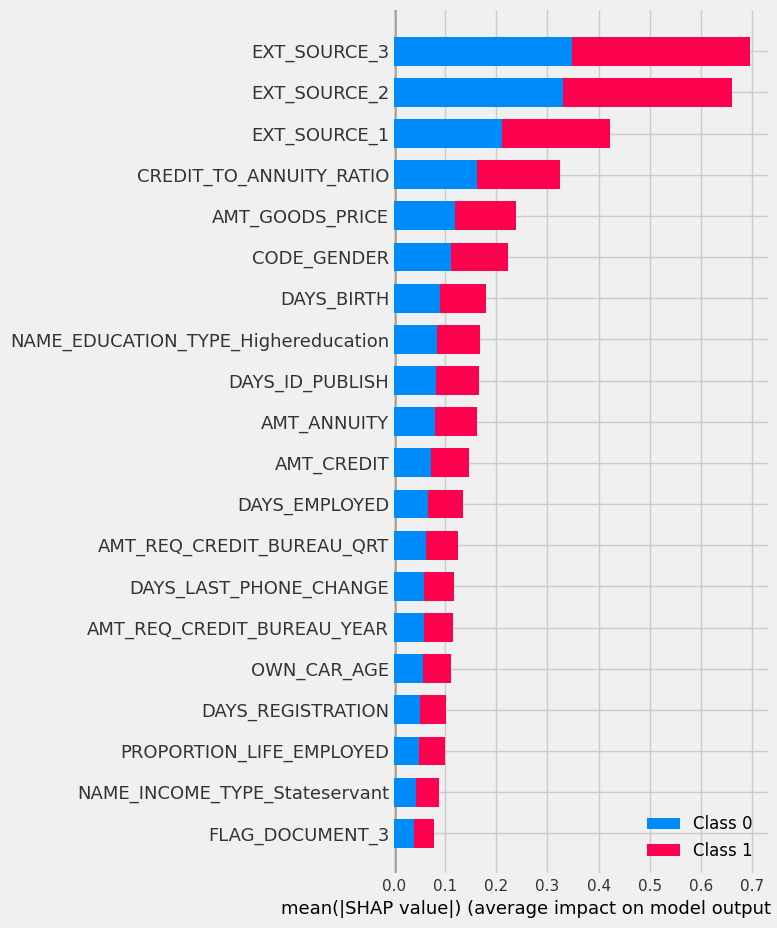

In [98]:
shap_values_test = explainer_shap.shap_values(test_features_set)

shap.summary_plot(shap_values,test_features_set)

In [99]:
test_features_set_0 = test_features_set.reset_index()

In [100]:
idx = random.randint(1, len(test_features_set))
print("Client numero : ", test_features_set_0.iloc[idx,0])

shap.force_plot(explainer_shap.expected_value[0], shap_values_test[0][idx,:], test_features_set.iloc[idx,:])

Client numero :  314366


In [101]:
idx = random.randint(1, len(test_features_set))
print("Client numero : ", test_features_set_0.iloc[idx,0])

shap.force_plot(explainer_shap.expected_value[0], shap_values_test[0][idx,:], test_features_set.iloc[idx,:])

Client numero :  280685


In [102]:
shap.force_plot(explainer_shap.expected_value[1], shap_values_test[1][:1000,:], test_features_set.iloc[:1000,:])

In [108]:
# Chargement du meilleur modèle
fichier_best_model = 'best_model.pickle'
with open(fichier_best_model, 'rb') as fichier:
    model_smote = pickle.load(fichier)

# Définition de X_train, y_train, X_test, y_test
X_train = train_set.drop(columns=['TARGET', 'SK_ID_CURR'])
y_train = train_labels
X_test = val_set.drop(columns=['TARGET'])
y_test = val_labels  

# Configuration de MLFlow Tracking
mlflow.set_tracking_uri("file:///Users/juliencaramanno/Desktop/Python/projet_7/mlruns")
mlflow.set_experiment("Experimentation de scoring de crédit")

with mlflow.start_run(run_name='test'):
    # Modification des paramètres du modèle
    params = {
        'n_estimators': 1000,
        'learning_rate': 0.01,
        'max_depth': 10,
        'num_leaves': 35,
        'colsample_bytree': 0.01,
        'reg_alpha': 0.1,
        'reg_lambda': 0.01,
        'subsample': 0.5
    }
    
    # Appliquer les modifications au modèle chargé
    model_smote.set_params(**params)
    
    for param, value in params.items():
        mlflow.log_param(param, value)
    
    # Réentraînement du modèle
    model_smote.fit(X_train, y_train)
    
    # Évaluation du modèle
    auc_score = roc_auc_score(y_test, model_smote.predict_proba(X_test)[:, 1])
    
    # Loguer la métrique AUC
    mlflow.log_metric("auc", auc_score)
    
    # Enregistrement du modèle ajusté dans MLFlow
    mlflow.sklearn.log_model(model_smote, "modele_ajuste_smote")

Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
Setuptools is replacing distutils.


cd Desktop/Python/projet_7   
mlflow ui... http://localhost:5000